# Part 3: Video Object Detection with CLIP

## African safari demo

Video: https://www.youtube.com/watch?v=x5OtCngO5A4

In [1]:
!cat ../../requirements-video.txt

torch
torchvision
git+https://github.com/openai/CLIP.git
opencv-python
pillow
scikit-learn
matplotlib


In [2]:
!ls ../../data/youtube-nature

African Safari 4K - Amazing Wildlife of African Savanna _ Scenic Relaxation Film-x5OtCngO5A4.mp4
embeddings


In [29]:
import os
import cv2
from PIL import Image
import torch
import numpy as np
from tqdm import tqdm

In [30]:
FRAME_INTERVAL_SECONDS = 1

def process_video(video_path: str, model, preprocess, device, frame_interval_seconds=1):
    video_name = os.path.basename(video_path)
    capture = cv2.VideoCapture(video_path)
    frame_rate = capture.get(cv2.CAP_PROP_FPS)
    frame_count = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = frame_count / frame_rate

    embeddings = []
    timestamps = []

    for sec in tqdm(list(range(1, int(duration), frame_interval_seconds))):
        capture.set(cv2.CAP_PROP_POS_MSEC, sec * 1000)
        success, frame = capture.read()
        if not success:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        image = Image.fromarray(frame)
        image_input = preprocess(image).unsqueeze(0).to(device)
        
        with torch.no_grad():
            image_features = model.encode_image(image_input)
        embeddings.append(image_features.cpu().numpy())
        timestamps.append(sec)

    capture.release()
    embeddings = np.concatenate(embeddings, axis=0)
    return video_name, embeddings, timestamps

def save_embeddings(video_name, embeddings, timestamps, embedding_path):
    torch.save((embeddings, timestamps), f"{embedding_path}/{video_name}_embeddings.pt")



In [6]:
import clip

In [7]:
torch.cuda.is_available()

False

In [8]:
torch.backends.mps.is_available()

True

In [9]:
# Check for MPS device availability
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using MPS device!")
else:
    print("MPS device not found, defaulting to CPU.")
    device = torch.device("cpu")

Using MPS device!


In [13]:
model, preprocess = clip.load("ViT-B/32", device=device)

In [18]:
d = preprocess(Image.open("../../data/unsplash-free-images/akira-hojo-ZxGdri2EWzk-unsplash.jpg"))

In [21]:
d.to(device)

tensor([[[-1.5295, -1.5295, -1.5003,  ..., -0.6244, -1.1061, -1.1791],
         [-1.5441, -1.5295, -1.5003,  ..., -0.6098, -1.2521, -1.3689],
         [-1.3981, -1.4419, -1.3105,  ..., -1.2521, -1.4419, -1.4857],
         ...,
         [-1.4711, -1.4857, -1.4711,  ..., -0.7996, -1.2813, -1.4419],
         [-1.4711, -1.4857, -1.4857,  ..., -0.9310, -1.3397, -1.3689],
         [-1.4711, -1.4565, -1.4419,  ..., -1.5587, -1.5295, -1.5295]],

        [[-1.1218, -1.0767, -0.9867,  ...,  0.0789, -0.3264, -0.4314],
         [-1.1668, -1.0617, -0.9417,  ...,  0.1089, -0.3864, -0.6265],
         [-0.7166, -0.7616, -0.6265,  ..., -0.4464, -0.6865, -0.8967],
         ...,
         [-1.2718, -1.2869, -1.2718,  ..., -0.2513, -0.5665, -0.7916],
         [-1.2118, -1.2718, -1.3019,  ..., -0.4164, -0.6415, -0.6415],
         [-1.1518, -1.1968, -1.2568,  ..., -0.8967, -0.8666, -0.8066]],

        [[-0.8119, -0.7550, -0.6697,  ...,  0.1693, -0.1435, -0.2289],
         [-0.8545, -0.7692, -0.6128,  ...,  0

In [31]:
video_name, embeddings, timestamps = process_video(
    "../../data/youtube-nature/African Safari 4K - Amazing Wildlife of African Savanna _ Scenic Relaxation Film-x5OtCngO5A4.mp4",
    model,
    preprocess,
    device,
    frame_interval_seconds=FRAME_INTERVAL_SECONDS
)

100%|██████████| 1769/1769 [17:22<00:00,  1.70it/s]


In [32]:
save_embeddings(video_name, embeddings, timestamps, embedding_path="../../data/youtube-nature/embeddings")

In [33]:
video_name

'African Safari 4K - Amazing Wildlife of African Savanna _ Scenic Relaxation Film-x5OtCngO5A4.mp4'

In [34]:
embeddings, timestamps = torch.load(f"../../data/youtube-nature/embeddings/{video_name}_embeddings.pt")

In [39]:
embeddings.shape


(1769, 512)

In [48]:
timestamps[-1] / 60

29.483333333333334

In [52]:
embeddings.mean(axis=1).shape

(1769,)

In [60]:
embeddings.mean()

np.float16(-0.00891)

In [63]:
embeddings.std(axis=1).mean()

np.float16(0.4626)

In [65]:
import seaborn as sns

<Axes: ylabel='Count'>

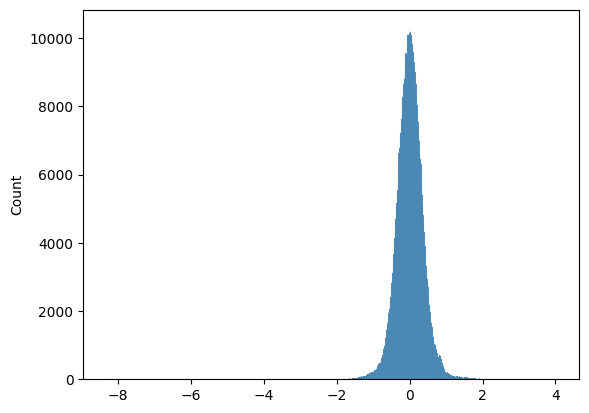

In [66]:
sns.histplot(embeddings.flatten())

In [81]:
from typing import List
from sklearn.metrics.pairwise import cosine_similarity

In [85]:
# Function to perform inference
def calculate_similarities(text_array: List[str], video_name, device, embedding_path):
    embeddings, timestamps = torch.load(f"{embedding_path}/{video_name}_embeddings.pt")
    embeddings = torch.tensor(embeddings)
    
    text_inputs = clip.tokenize(text_array).to(device)
    with torch.no_grad():
        text_features = model.encode_text(text_inputs)
    
    similarities = cosine_similarity(text_features.to("cpu"), embeddings)
    
    return timestamps, similarities

In [86]:
# Animals on an African Lion Safari
african_animals = [
    "lion",
    "zebra",
    "giraffe",
    "rhinoceros",
    "cheetah",
    "hippopotamus",
    "baboon",
    "crocodile"
]

# General things you might see in nature
natural_elements = [
    "tree",
    "sky",
    "mountain",
    "river",
    "lake",
    "ocean",
    "grass",
    "flower",
    "bird",
    "insect",
    "rock",
    "cloud"
]

# Random objects in a city, home, or office
city_objects = [
    "car",
    "building",
    "street",
    "lamp",
    "chair",
    "table",
    "computer",
    "phone",
    "book",
    "pen",
    "coffee cup",
    "plant"
]


In [87]:
embedding_path="../../data/youtube-nature/embeddings"
timestamps, similarities = calculate_similarities(african_animals, video_name, device, embedding_path)

In [88]:
similarities

array([[0.19923863, 0.17868274, 0.18974441, ..., 0.17263451, 0.17099048,
        0.16626544],
       [0.22118633, 0.20366575, 0.21203068, ..., 0.25911309, 0.25918533,
        0.25644549],
       [0.20580595, 0.19037868, 0.19018482, ..., 0.20770376, 0.21060702,
        0.20296448],
       ...,
       [0.20216846, 0.1700264 , 0.17168512, ..., 0.17914011, 0.17950771,
        0.16928408],
       [0.22722951, 0.20941654, 0.21266534, ..., 0.18107211, 0.17978829,
        0.18002245],
       [0.18088239, 0.15998771, 0.15021819, ..., 0.14472377, 0.14950524,
        0.14750887]])

In [89]:
similarities.shape

(8, 1769)

In [90]:
def plot_similariries(text_array, similarities, timestamps):
    # Plot results
    plt.figure()
    for text, scores in zip(text_array, similarities):
        plt.plot(timestamps, scores, label=text)
    plt.xlabel('Time (s)')
    plt.ylabel('Similarity')
    plt.legend()
    plt.show()

In [92]:
import matplotlib.pyplot as plt

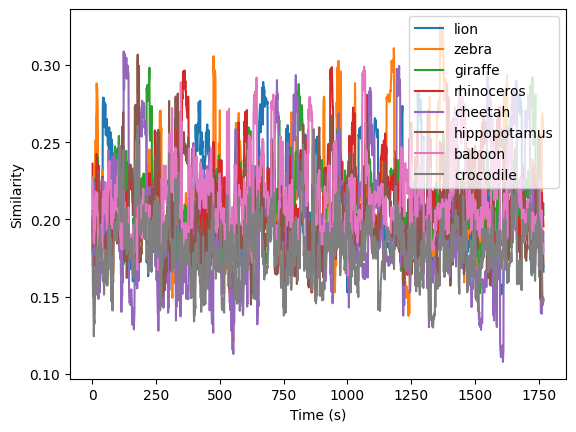

In [93]:
plot_similariries(african_animals, similarities, timestamps)

In [189]:

def smooth_timeseries(data, window_size=50):
    smoothed_data = np.zeros_like(data)
    for i in range(data.shape[0]):
        smoothed_data[i] = np.convolve(data[i], np.ones(window_size)/window_size, mode='same')
    return smoothed_data

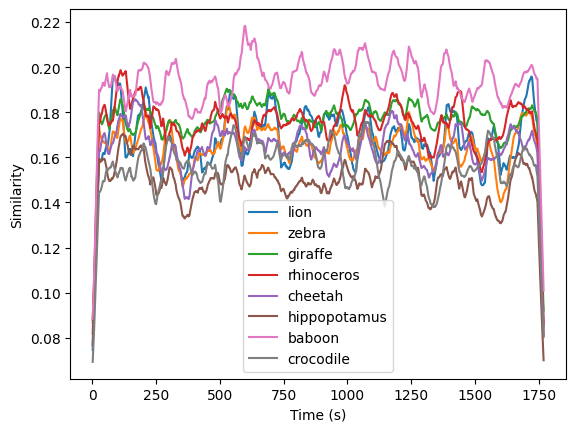

In [190]:
plot_similariries(african_animals, smooth_timeseries(similarities), timestamps)

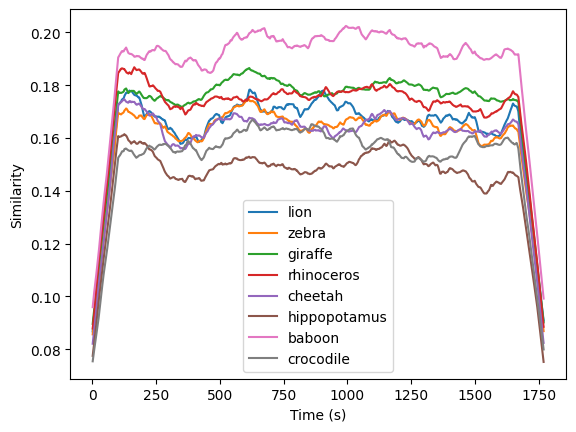

In [191]:

plot_similariries(african_animals, smooth_timeseries(similarities, window_size=200), timestamps)

In [197]:
from scipy.signal import find_peaks


def calculate_peaks(smoothed_scores, find_peaks_distance=100):
    peaks = []
    for scores in smoothed_scores:
        score_peaks, _ = find_peaks(scores, distance=find_peaks_distance)
        fltr = scores[score_peaks] > np.mean(scores)
        score_peaks = score_peaks[fltr]
        peaks.append(score_peaks)
    return peaks


In [198]:
def plot_similariries_with_peaks(text_array, similarities, timestamps, peaks, plot_peaks=True, plot_subset=None):
    # Plot results
    plt.figure()
    for text, scores, score_peaks in zip(text_array, similarities, peaks):
        if plot_subset:
            if text not in plot_subset:
                continue
        plt.plot(timestamps, scores, label=text)
        if plot_peaks:
            plt.plot(timestamps[score_peaks], scores[score_peaks], 'rx', label='_Peaks')
    plt.xlabel('Time (s)')
    plt.ylabel('Similarity')
    plt.legend()
    plt.show()

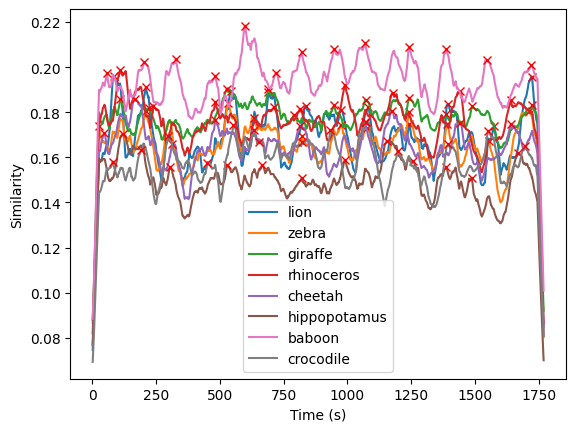

In [199]:

# Plot results with peaks
smoothed_scores = smooth_timeseries(similarities)
peaks = calculate_peaks(smoothed_scores)
plot_similariries_with_peaks(african_animals, np.array(smoothed_scores), np.array(timestamps), peaks)

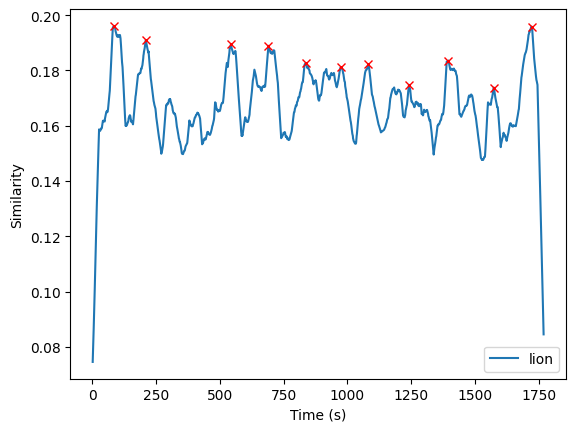

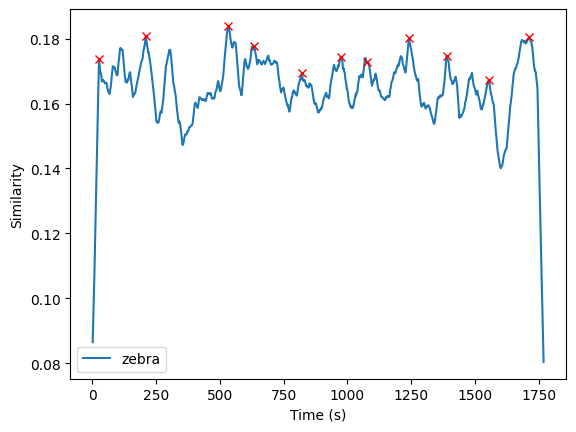

In [200]:
for animal in african_animals[:2]:
    plot_similariries_with_peaks(african_animals, np.array(smoothed_scores), np.array(timestamps), peaks, plot_subset=[animal])

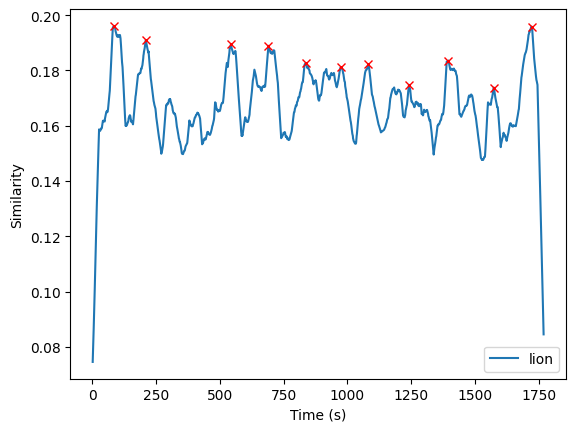

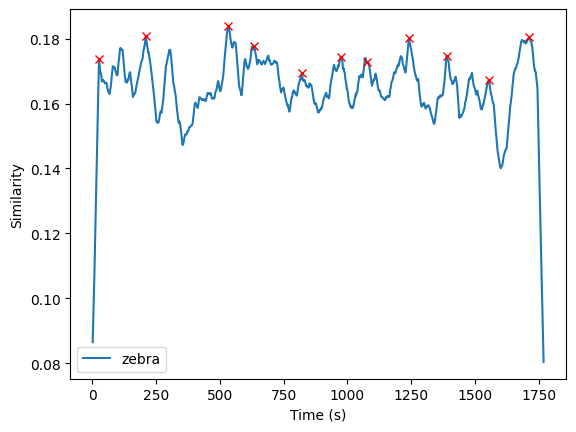

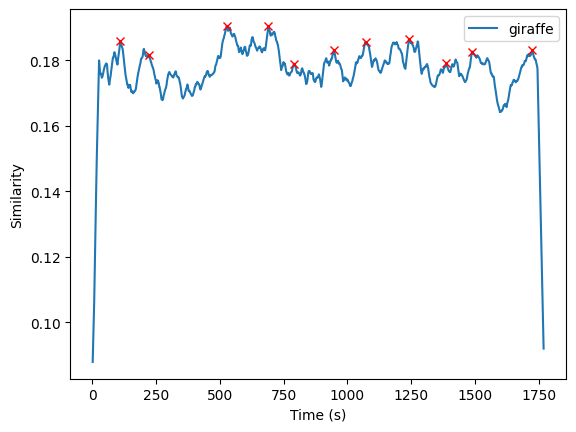

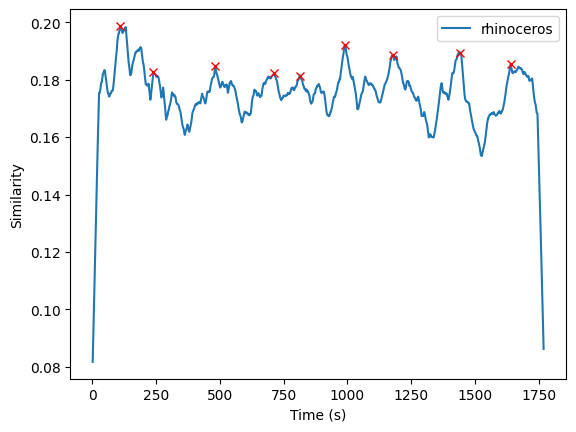

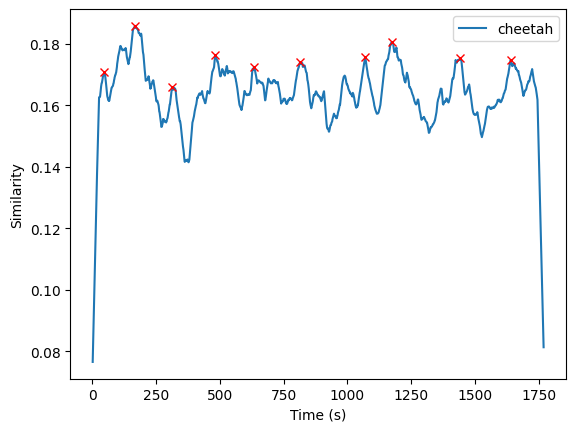

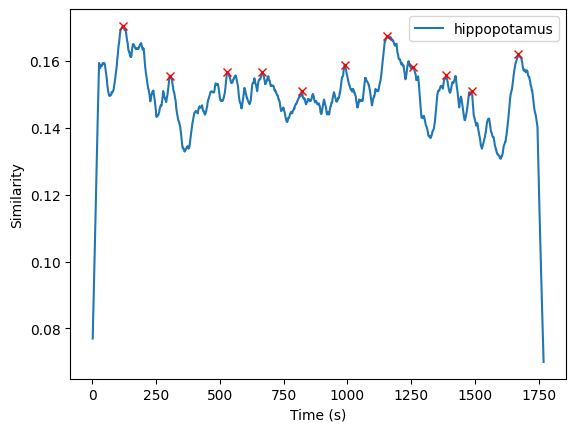

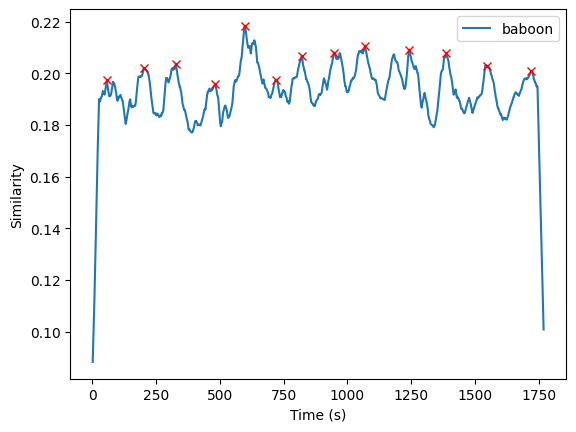

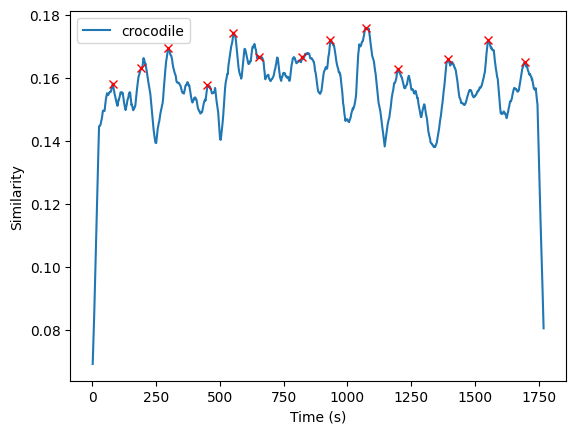

In [201]:
for animal in african_animals:
    plot_similariries_with_peaks(african_animals, np.array(smoothed_scores), np.array(timestamps), peaks, plot_subset=[animal])

In [202]:
from datetime import timedelta

In [203]:
for animal, peak_times in zip(african_animals, peaks):
    print(f"{animal}: {', '.join(str(timedelta(seconds=int(pt))) for pt in peak_times)}")

lion: 0:01:25, 0:03:28, 0:09:02, 0:11:29, 0:13:56, 0:16:13, 0:18:01, 0:20:40, 0:23:15, 0:26:13, 0:28:41
zebra: 0:00:25, 0:03:28, 0:08:52, 0:10:34, 0:13:40, 0:16:15, 0:17:57, 0:20:40, 0:23:08, 0:25:54, 0:28:32
giraffe: 0:01:49, 0:03:39, 0:08:46, 0:11:29, 0:13:09, 0:15:46, 0:17:50, 0:20:40, 0:23:07, 0:24:48, 0:28:43
rhinoceros: 0:01:49, 0:03:58, 0:08:00, 0:11:52, 0:13:33, 0:16:28, 0:19:36, 0:23:59, 0:27:19
cheetah: 0:00:46, 0:02:47, 0:05:11, 0:08:00, 0:10:34, 0:13:33, 0:17:48, 0:19:33, 0:24:02, 0:27:19
hippopotamus: 0:01:59, 0:05:04, 0:08:48, 0:11:05, 0:13:40, 0:16:28, 0:19:15, 0:20:56, 0:23:07, 0:24:47, 0:27:49
baboon: 0:00:56, 0:03:21, 0:05:26, 0:08:00, 0:09:58, 0:11:58, 0:13:40, 0:15:46, 0:17:48, 0:20:40, 0:23:07, 0:25:46, 0:28:40
crocodile: 0:01:19, 0:03:10, 0:04:56, 0:07:30, 0:09:12, 0:10:54, 0:13:42, 0:15:32, 0:17:50, 0:19:57, 0:23:15, 0:25:50, 0:28:14


In [204]:
def load_video_frames(video_path, frame_interval_seconds=1, as_size=(1280,720)):
    capture = cv2.VideoCapture(video_path)
    frame_rate = capture.get(cv2.CAP_PROP_FPS)
    frame_count = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = frame_count / frame_rate

    frames = []
    for sec in tqdm(list(range(0, int(duration), frame_interval_seconds))):
        capture.set(cv2.CAP_PROP_POS_MSEC, sec * 1000)
        success, frame = capture.read()
        if not success:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = cv2.resize(frame, as_size)
        frames.append(frame)

    return np.stack(frames)

In [ ]:
video_path = '../../data/youtube-nature/African Safari 4K - Amazing Wildlife of African Savanna _ Scenic Relaxation Film-x5OtCngO5A4.mp4'
video_frames = load_video_frames(video_path)

In [206]:
video_frames.shape

(1770, 720, 1280, 3)

In [144]:
torch.save(torch.tensor(video_frames), f"../../data/youtube-nature/frames/{video_name}_frames.pt")

In [207]:
video_frames = np.array(torch.load(f"../../data/youtube-nature/frames/{video_name}_frames.pt"))

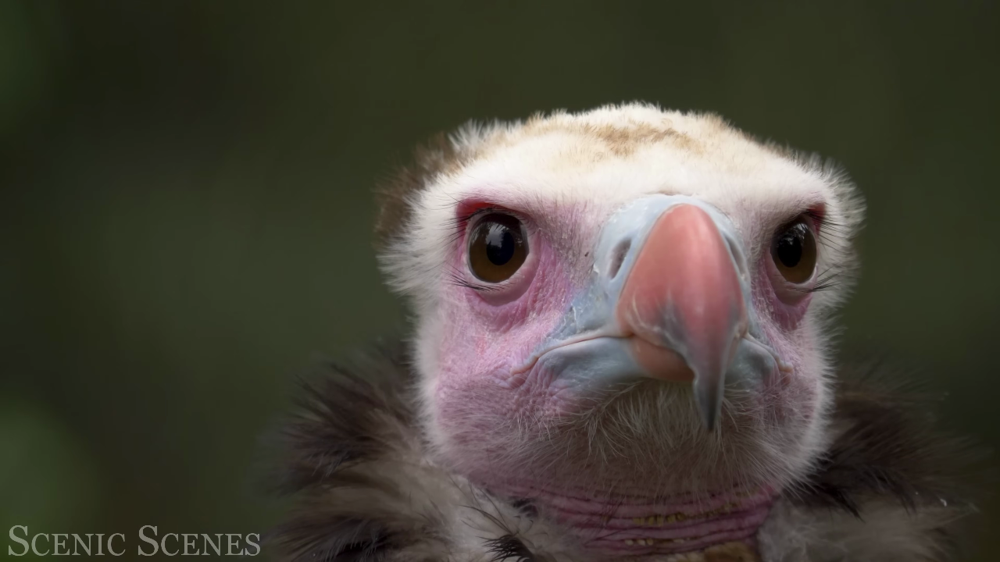

In [208]:
Image.fromarray(video_frames[288])

In [209]:
from torchvision.utils import make_grid
from torchvision import transforms

In [ ]:
for animal, peak_times in zip(african_animals[:2], peaks[:2]):
    print(animal)
    print(', '.join(str(timedelta(seconds=int(pt))) for pt in peak_times))
    # ipyplot.plot_images([Image.fromarray(vfs) for vfs in video_frames[peak_times]], max_images=20, img_width=150)
    
    target_size = (455, 256)
    # reshape_transform = lambda image_tensor: transforms.Resize(target_size)(image_tensor).expand(3, -1, -1)
    # reshape_transform = lambda image_tensor: image_tensor.reshape(3, 720, 1280)
    # resized_images = [reshape_transform(torch.tensor(image)) for image in video_frames[peak_times]]
    resized_images = [transforms.ToTensor()(Image.fromarray(image)) for image in video_frames[peak_times]]
    grid = make_grid(resized_images)
    display(transforms.ToPILImage()(grid))

    print("-"*150)

In [ ]:
for animal, peak_times in zip(african_animals, peaks):
    print(animal)
    print(', '.join(str(timedelta(seconds=int(pt))) for pt in peak_times))
    # ipyplot.plot_images([Image.fromarray(vfs) for vfs in video_frames[peak_times]], max_images=20, img_width=150)
    
    target_size = (455, 256)
    # reshape_transform = lambda image_tensor: transforms.Resize(target_size)(image_tensor).expand(3, -1, -1)
    # reshape_transform = lambda image_tensor: image_tensor.reshape(3, 720, 1280)
    # resized_images = [reshape_transform(torch.tensor(image)) for image in video_frames[peak_times]]
    resized_images = [transforms.ToTensor()(Image.fromarray(image)) for image in video_frames[peak_times]]
    grid = make_grid(resized_images)
    display(transforms.ToPILImage()(grid))

    print("-"*150)

In [211]:
def calculate_peaks(smoothed_scores, find_peaks_distance=100, min_confidence=0.25):
    peaks = []
    for scores in smoothed_scores:
        score_peaks, _ = find_peaks(scores, distance=find_peaks_distance)
        score_peaks = score_peaks[(scores[score_peaks] > np.mean(scores)) & (scores[score_peaks] > min_confidence)]
        peaks.append(score_peaks)
    return peaks

In [ ]:
search_terms = african_animals + natural_elements + city_objects
timestamps, similarities = calculate_similarities(search_terms, video_name, device, embedding_path="../../data/youtube-nature/embeddings")
smoothed_scores = smooth_timeseries(similarities)
peaks = calculate_peaks(smoothed_scores, min_confidence=0.25)
plot_similariries_with_peaks(search_terms, np.array(smoothed_scores), np.array(timestamps), peaks, plot_peaks=False)

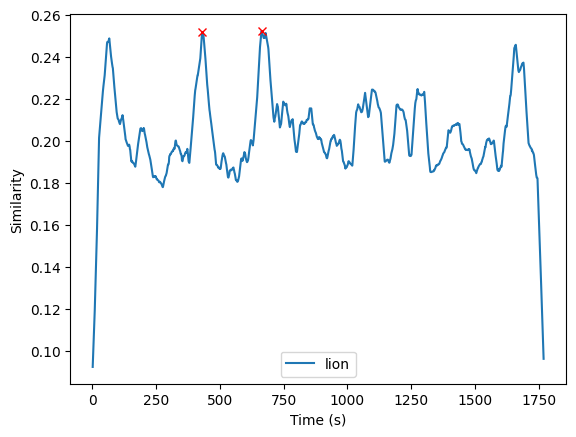

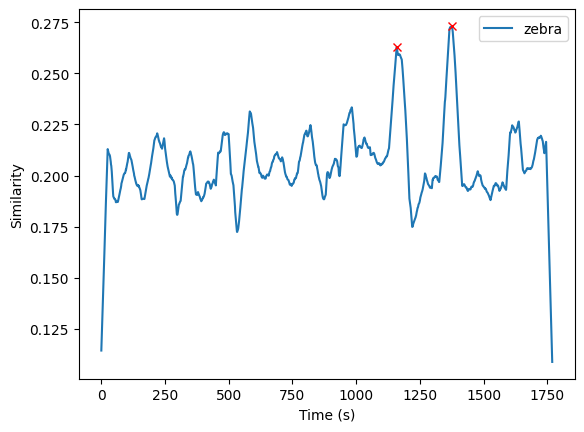

In [213]:
for item in search_terms[:2]:
    plot_similariries_with_peaks(search_terms, np.array(smoothed_scores), np.array(timestamps), peaks, plot_subset=[item])

In [ ]:
for item in search_terms:
    plot_similariries_with_peaks(search_terms, np.array(smoothed_scores), np.array(timestamps), peaks, plot_subset=[item])

lion
0:07:09, 0:11:02


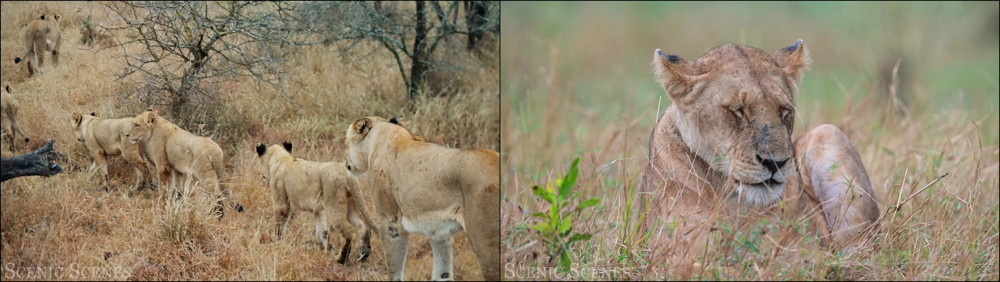

------------------------------------------------------------------------------------------------------------------------------------------------------
zebra
0:19:18, 0:22:55


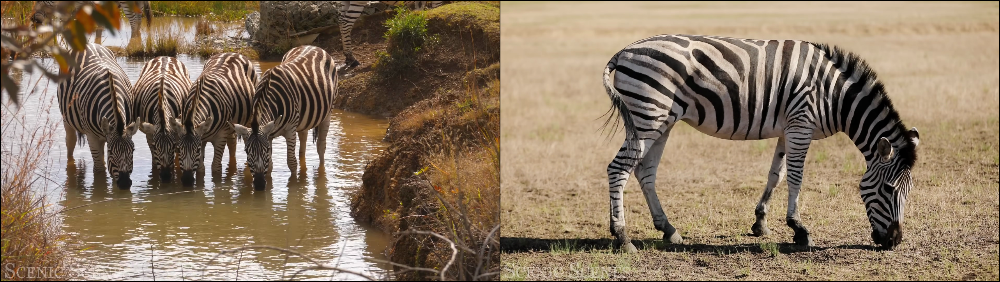

------------------------------------------------------------------------------------------------------------------------------------------------------
giraffe
------------------------------------------------------------------------------------------------------------------------------------------------------
rhinoceros
0:05:52


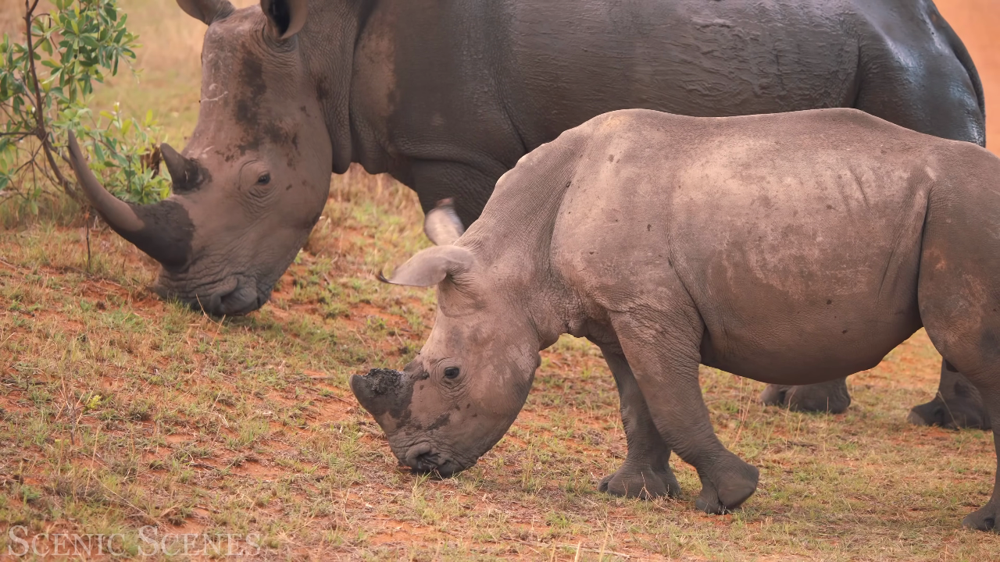

------------------------------------------------------------------------------------------------------------------------------------------------------
cheetah
------------------------------------------------------------------------------------------------------------------------------------------------------
hippopotamus
------------------------------------------------------------------------------------------------------------------------------------------------------
baboon
0:23:57


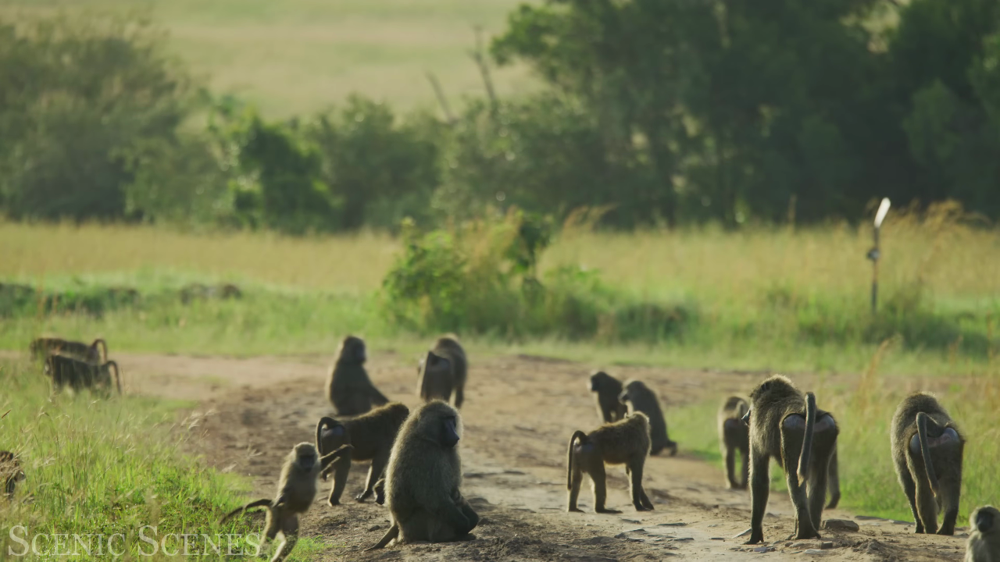

------------------------------------------------------------------------------------------------------------------------------------------------------
crocodile
------------------------------------------------------------------------------------------------------------------------------------------------------
tree
------------------------------------------------------------------------------------------------------------------------------------------------------
sky
------------------------------------------------------------------------------------------------------------------------------------------------------
mountain
------------------------------------------------------------------------------------------------------------------------------------------------------
river
------------------------------------------------------------------------------------------------------------------------------------------------------
lake
-------------------------------------------------------

In [214]:
def plot_match_grid(search_terms, peaks, video_frames):
    for text, peak_times in zip(search_terms, peaks):
        print(text)
        if len(peak_times) > 0:
            print(', '.join(str(timedelta(seconds=int(pt))) for pt in peak_times))
            resized_images = [transforms.ToTensor()(Image.fromarray(image)) for image in video_frames[peak_times]]
            grid = make_grid(resized_images)
            display(transforms.ToPILImage()(grid))
        print("-"*150)

plot_match_grid(search_terms, peaks, video_frames)

In [ ]:
peaks = calculate_peaks(smoothed_scores, min_confidence=0.24)
plot_match_grid(search_terms, peaks, video_frames)

In [215]:
plot_kwargs = dict(text_array=search_terms, similarities=np.array(smoothed_scores), timestamps=np.array(timestamps), peaks=peaks)

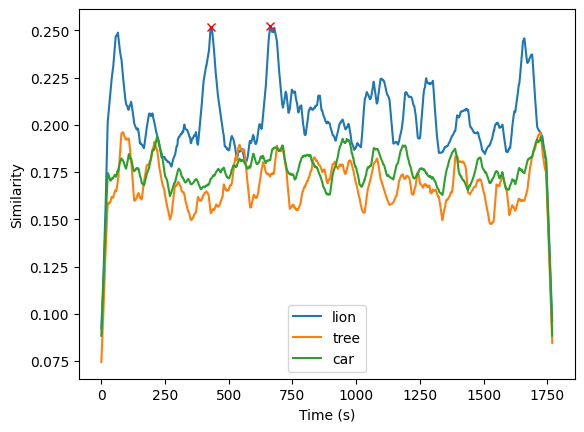

In [216]:
plot_similariries_with_peaks(**plot_kwargs, plot_subset=["lion", "tree", "car"])

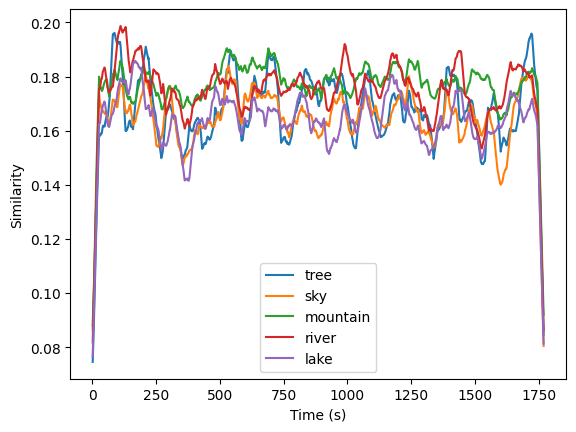

In [217]:
plot_similariries_with_peaks(**plot_kwargs, plot_subset=natural_elements[:5])

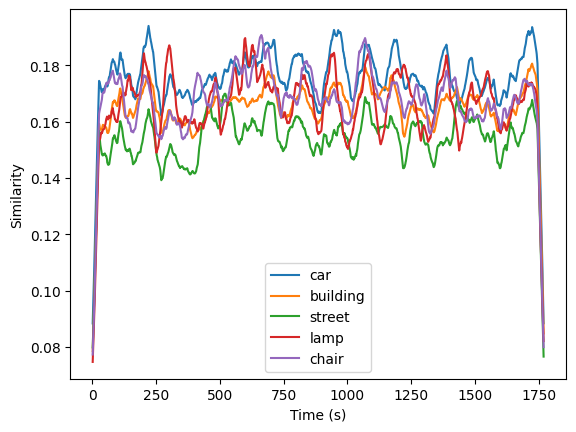

In [218]:
plot_similariries_with_peaks(**plot_kwargs, plot_subset=city_objects[:5])

In [219]:
peaks = calculate_peaks(smoothed_scores, find_peaks_distance=100, min_confidence=0)

In [220]:
similarities[0][np.array([  65,  190,  429,  662,  851, 1095, 1274, 1432, 1659])]

array([0.25962265, 0.22291733, 0.25113356, 0.27043391, 0.2046094 ,
       0.20437089, 0.18644929, 0.20873652, 0.21888871])

In [221]:
peaks

[array([  65,  190,  429,  662,  851, 1095, 1274, 1432, 1659]),
 array([  25,  219,  349,  482,  582,  689,  820,  982, 1158, 1375, 1637,
        1744]),
 array([  85,  208,  325,  482,  595,  801,  969, 1178, 1369, 1719]),
 array([ 108,  246,  352,  584,  689,  819,  946, 1155, 1269, 1386, 1487,
        1600, 1730]),
 array([  79,  208,  434,  678,  810,  971, 1109, 1209, 1395, 1559, 1660]),
 array([ 158,  350,  586,  689,  831,  935, 1041, 1146, 1387, 1487, 1600,
        1730]),
 array([  79,  325,  448,  656,  846, 1082, 1227, 1437, 1573]),
 array([ 189,  311,  480,  634,  813,  980, 1082, 1197, 1442, 1639]),
 array([  85,  208,  542,  689,  836,  973, 1081, 1240, 1395, 1573, 1721]),
 array([  25,  208,  532,  634,  820,  975, 1077, 1240, 1388, 1554, 1712]),
 array([ 109,  219,  526,  689,  789,  946, 1070, 1240, 1387, 1488, 1723]),
 array([ 109,  238,  480,  712,  813,  988, 1176, 1439, 1639]),
 array([  46,  167,  311,  480,  634,  813, 1068, 1173, 1442, 1639]),
 array([ 119,  304

In [222]:
mean_scores = []
mean_peak_scores = []
for text, scores, peak_times in zip(search_terms, similarities, peaks):
    peak_scores = scores[peak_times]
    mean_scores.append(scores.mean())
    mean_peak_scores.append(peak_scores.mean())

In [223]:
similarities[0][np.array([  65,  190,  429,  662,  851, 1095, 1274, 1432, 1659])].mean()

np.float64(0.22524025118967106)

In [224]:
similarities[0].mean()

np.float64(0.20431486542581462)

In [225]:
import pandas as pd

In [226]:
df_scores = pd.DataFrame(dict(text=search_terms, mean_score=mean_scores, mean_peak_score=mean_peak_scores))

In [227]:
df_scores.sort_values("mean_peak_score", ascending=False)

,text,mean_score,mean_peak_score
6,baboon,0.212002,0.239008
1,zebra,0.207297,0.236692
3,rhinoceros,0.213035,0.231314
0,lion,0.204315,0.225240
4,cheetah,0.197203,0.225142
2,giraffe,0.206191,0.225063
5,hippopotamus,0.201799,0.213871
14,grass,0.194286,0.202702
29,pen,0.188157,0.198031
18,rock,0.182697,0.188795


In [228]:
natural_elements

['tree',
 'sky',
 'mountain',
 'river',
 'lake',
 'ocean',
 'grass',
 'flower',
 'bird',
 'insect',
 'rock',
 'cloud']

In [ ]:
timestamps, similarities = calculate_similarities(natural_elements, video_name, device, embedding_path="../../data/youtube-nature/embeddings")
smoothed_scores = smooth_timeseries(similarities)
peaks = calculate_peaks(smoothed_scores, min_confidence=0.2)
plot_match_grid(natural_elements, peaks, video_frames)

In [ ]:
peaks = calculate_peaks(smoothed_scores, min_confidence=0.19)
plot_match_grid(natural_elements, peaks, video_frames)

In [ ]:
peaks = calculate_peaks(smoothed_scores, min_confidence=0.19)
plot_match_grid(natural_elements, peaks, video_frames)